In [3]:
import pandas as pd
import numpy as np
#df=pd.read_csv('/Users/user/Desktop/isc_gem/isc_gem.csv',header=None,sep=',')
df=pd.read_csv('/Users/Dell/Desktop/Tibet_2025udaya.csv',header=None,sep = ',')#,engine='python')#,delimiter='\s+ ',engine='python')
df.head()

,0,1,2,3,4
0,datetime,latitude,longitude,depth,mag
1,2025-01-27T09:33:38.040Z,28.6171,87.4185,10,5.0
2,2025-01-24T05:59:17.625Z,28.8604,87.4961,10,4.7
3,2025-01-22T11:30:24.951Z,28.5844,87.6224,10,4.1
4,2025-01-21T00:14:23.782Z,28.3392,87.4183,54.8,4.9


In [4]:
import pandas as pd

def calculate_magnitude_completeness(data, magnitude_column):
    # Sort the data by magnitude in descending order
    sorted_data = data.sort_values(magnitude_column, ascending=False)
    
    # Get the unique magnitudes
    magnitudes = sorted_data[magnitude_column].unique()
    
    # Calculate the cumulative number of earthquakes for each magnitude
    cumulative_counts = []
    for magnitude in magnitudes:
        count = len(sorted_data[sorted_data[magnitude_column] >= magnitude])
        cumulative_counts.append(count)
    
    # Calculate the percentage of cumulative counts
    total_count = len(data)
    percentages = [(count / total_count) * 100 for count in cumulative_counts]
    
    # Find the magnitude completeness (90% rule)
    magnitude_completeness = None
    for i, percentage in enumerate(percentages):
        if percentage >= 90:
            magnitude_completeness = magnitudes[i]
            break
    
    return magnitude_completeness

# Load earthquake data from CSV
data = pd.read_csv('/Users/Dell/Desktop/Tibet_2025udaya.csv')

# Convert 'datetime' column from UTC string to pandas datetime (ensure it's correctly parsed)
data['datetime'] = pd.to_datetime(data['datetime'], utc=True)

# Specify the column name for magnitude
magnitude_column = 'mag'  # Ensure this matches the name of your magnitude column

# Calculate the magnitude completeness
completeness = calculate_magnitude_completeness(data, magnitude_column)
print('Magnitude Completeness:', completeness)


Magnitude Completeness: 4.0


In [5]:
import pandas as pd

def calculate_magnitude_completeness(data, magnitude_column):
    # Sort the data by magnitude in descending order
    sorted_data = data.sort_values(magnitude_column, ascending=False)
    
    # Get the unique magnitudes
    magnitudes = sorted_data[magnitude_column].unique()
    
    # Calculate the cumulative number of earthquakes for each magnitude
    cumulative_counts = []
    for magnitude in magnitudes:
        count = len(sorted_data[sorted_data[magnitude_column] >= magnitude])
        cumulative_counts.append(count)
    
    # Calculate the percentage of cumulative counts
    total_count = len(data)
    percentages = [(count / total_count) * 100 for count in cumulative_counts]  # Fixed typo here
    
    # Find the magnitude completeness (90% rule)
    magnitude_completeness = None
    for i, percentage in enumerate(percentages):
        if percentage >= 90:
            magnitude_completeness = magnitudes[i]
            break
    
    return magnitude_completeness

# Load earthquake data from CSV
data = pd.read_csv('/Users/Dell/Desktop/Tibet_2025udaya.csv')

# Convert 'datetime' column from UTC string to pandas datetime (ensure it's correctly parsed)
data['datetime'] = pd.to_datetime(data['datetime'], utc=True)

# Specify the column name for magnitude
magnitude_column = 'mag'  # Ensure this matches the name of your magnitude column

# Calculate the magnitude completeness
completeness = calculate_magnitude_completeness(data, magnitude_column)
print('Magnitude Completeness:', completeness)


Magnitude Completeness: 4.0


In [6]:
import pandas as pd

def process_datetime(data):
    # Convert 'datetime' column from UTC string to pandas datetime (ensure it's correctly parsed)
    data['datetime'] = pd.to_datetime(data['datetime'], utc=True)

    # Extract the year, month, day, and time (hour, minute, second)
    data['year'] = data['datetime'].dt.year
    data['month'] = data['datetime'].dt.month
    data['day'] = data['datetime'].dt.day
    data['hour'] = data['datetime'].dt.hour
    data['minute'] = data['datetime'].dt.minute
    data['second'] = data['datetime'].dt.second
    data['time'] = data['datetime'].dt.time  # Extracts time as HH:MM:SS

    return data

# Load earthquake data from CSV
data = pd.read_csv('/Users/Dell/Desktop/Tibet_2025udaya.csv')

# Process the 'datetime' column
data = process_datetime(data)

# Now the 'data' DataFrame has 'year', 'month', 'day', 'hour', 'minute', 'second', and 'time' columns
print(data.head())  # To see the first few rows of the DataFrame with the new columns


                          datetime  latitude  longitude  depth  mag  year  \
0 2025-01-27 09:33:38.040000+00:00   28.6171    87.4185   10.0  5.0  2025   
1 2025-01-24 05:59:17.625000+00:00   28.8604    87.4961   10.0  4.7  2025   
2 2025-01-22 11:30:24.951000+00:00   28.5844    87.6224   10.0  4.1  2025   
3 2025-01-21 00:14:23.782000+00:00   28.3392    87.4183   54.8  4.9  2025   
4 2025-01-20 21:03:11.979000+00:00   28.4231    87.5256   10.0  5.2  2025   

   month  day  hour  minute  second             time  
0      1   27     9      33      38  09:33:38.040000  
1      1   24     5      59      17  05:59:17.625000  
2      1   22    11      30      24  11:30:24.951000  
3      1   21     0      14      23  00:14:23.782000  
4      1   20    21       3      11  21:03:11.979000  


Minimum magnitude: 4.0
Total number of earthquakes: 201
Annual number of earthquakes greater than Mw 4.0 : 8.04
Maximum catalog magnitude: 7.1
Mmax = 7.199999999999999
Maximum Likelihood: b value 0.89
Standard deviation: 0.06
R-squared: 0.64


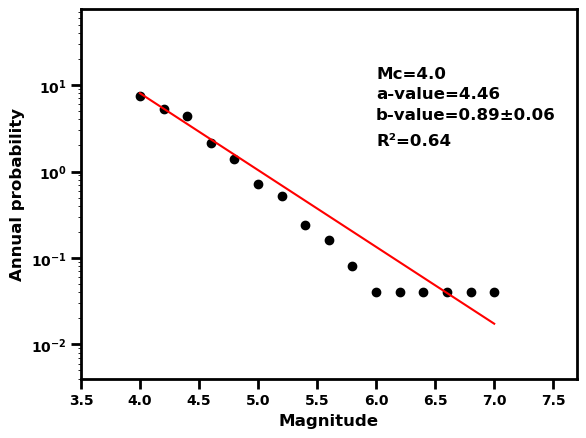

(array([188, 133, 111,  54,  35,  18,  13,   6,   4,   2,   1,   1,   1,
          1,   1,   1], dtype=int64),
 array([4. , 4.2, 4.4, 4.6, 4.8, 5. , 5.2, 5.4, 5.6, 5.8, 6. , 6.2, 6.4,
        6.6, 6.8, 7. ]))

In [7]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

def calc_recurrence(data, min_mag=None, max_mag=None, interval=0.1):
    magnitudes = data['mag'].values
    years = data['year'].values

    if min_mag is None:
        min_mag = -1.0

    if min_mag == -1.0:
        min_mag = min(magnitudes)

    if max_mag is None:
        max_mag = max(magnitudes) + 0.1

    num_eq = len(magnitudes)
    print('Minimum magnitude:', min_mag)
    print('Total number of earthquakes:', num_eq)
    num_years = max(years) - min(years)
    annual_num_eq = num_eq / num_years
    print('Annual number of earthquakes greater than Mw', min_mag, ':', annual_num_eq)
    print('Maximum catalog magnitude:', max(magnitudes))
    print('Mmax =', max_mag)
    max_mag_bin = max(magnitudes) + 0.15

    bins = np.arange(min_mag, max_mag_bin, interval)
    plot_bins = np.arange(min_mag, max_mag, interval)

    hist = np.histogram(magnitudes, bins=bins)
    hist = hist[0][::-1]
    bins = bins[::-1]
    cum_hist = hist.cumsum()
    bins = bins[1:]

    cum_annual_rate = cum_hist / num_years

    new_cum_annual_rate = cum_annual_rate + 1e-20

    log_cum_sum = np.log10(new_cum_annual_rate)

    dm = 0.1
    b_mle = np.log10(np.exp(1)) / (np.mean(magnitudes) - (min_mag - dm / 2))
    b_dev = 2.3 * b_mle ** 2 * (np.var(magnitudes) / num_eq) ** 0.5
    print('Maximum Likelihood: b value', round(b_mle, 2))
    print('Standard deviation:', round(b_dev, 2))

    mle_fit = -1.0 * b_mle * plot_bins + 1.0 * b_mle * min_mag + np.log10(annual_num_eq)
    log_mle_fit = np.power(10, mle_fit)

    a_value = np.log10(annual_num_eq) + b_mle * min_mag

    slope, intercept, r_value, p_value, std_err = stats.linregress(bins, new_cum_annual_rate)
    print('R-squared:', round(r_value ** 2, 2))

    # Plot the recurrence plot
    fig, ax = plt.subplots()
    ax.scatter(bins, new_cum_annual_rate, c='k')
    ax.plot(plot_bins, log_mle_fit, c='r')

    ax.set_yscale('log')
    ax.set_ylim([min(new_cum_annual_rate) * 0.1, max(new_cum_annual_rate) * 10.])
    ax.set_xlim([min_mag - 0.5, max_mag + 0.5])
    ax.set_ylabel('Annual probability', fontsize=12, fontweight='bold')
    ax.set_xlabel('Magnitude', fontsize=12, fontweight='bold')
    ax.text(6.00, 2.00, "R\u00b2={}".format(round(r_value ** 2, 2)), fontsize=12, fontweight='bold')
    ax.text(6.00, 4.00, "b-value={:.2f}±{:.2f}".format(b_mle, b_dev), fontsize=12, fontweight='bold')
    ax.text(6.00, 7.00, "a-value={:.2f}".format(a_value), fontsize=12, fontweight='bold')
    ax.text(6.00, 12.00, "Mc={}".format(round(min_mag, 2)), fontsize=12, fontweight='bold')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.tick_params(axis='both', which='major', width=2, length=7)
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontweight('bold')

    plt.show()

    return cum_hist[::-1], bins[::-1]

# Call the function with your DataFrame (no need for a file)
calc_recurrence(data, min_mag=4.0, max_mag=None, interval=0.2)


Minimum magnitude: 4.0
Total number of earthquakes: 139
Annual number of earthquakes greater than Mw 4.0 : 5.56
Maximum catalog magnitude: 6.0
Mmax = 6.1
Maximum Likelihood: b value 0.99
Standard deviation: 0.09
R-squared: 0.82


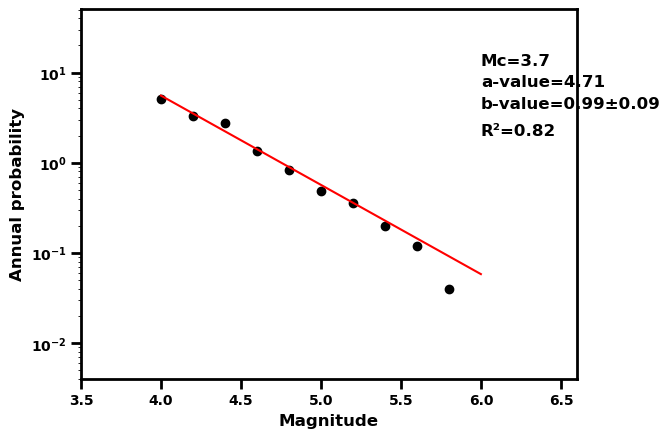

(array([126,  83,  69,  34,  21,  12,   9,   5,   3,   1], dtype=int64),
 array([4. , 4.2, 4.4, 4.6, 4.8, 5. , 5.2, 5.4, 5.6, 5.8]))

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Load earthquake data from CSV
data = pd.read_csv('/Users/Dell/Desktop/Tibet_2025udaya.csv')

# Convert 'datetime' to pandas datetime and ensure it's in UTC
data['datetime'] = pd.to_datetime(data['datetime'], utc=True)

# Find the 7.1 magnitude earthquake
eq_7_1 = data[data['mag'] == 7.1].iloc[0]

# Extract the epicenter coordinates and datetime of the 7.1 event
epicenter_lat = eq_7_1['latitude']
epicenter_lon = eq_7_1['longitude']
eq_time = eq_7_1['datetime']

# Filter events within a 1-degree radius of the epicenter
def filter_events_around_epicenter(df, lat, lon, radius=1.5):
    # Calculate the absolute difference in latitude and longitude
    df['lat_diff'] = np.abs(df['latitude'] - lat)
    df['lon_diff'] = np.abs(df['longitude'] - lon)
    
    # Filter events that are within the 1-degree radius
    return df[(df['lat_diff'] <= radius) & (df['lon_diff'] <= radius)]

# Filter the events based on the epicenter and radius
filtered_data = filter_events_around_epicenter(data, epicenter_lat, epicenter_lon)

# Eliminate events after the 7.1 earthquake and its aftershocks
filtered_data_before_eq = filtered_data[filtered_data['datetime'] < eq_time]

# Perform the recurrence analysis before the earthquake

def calc_recurrence(data, min_mag=4.0, max_mag=None, interval=0.1):
    magnitudes = data['mag']
    years = data['datetime'].dt.year

    if min_mag is None:
        min_mag = -1.0

    if max_mag is None:
        max_mag = max(magnitudes) + 0.1

    num_eq = len(magnitudes)
    print('Minimum magnitude:', min_mag)
    print('Total number of earthquakes:', num_eq)
    num_years = max(years) - min(years)
    annual_num_eq = num_eq / num_years
    print('Annual number of earthquakes greater than Mw', min_mag, ':', annual_num_eq)
    print('Maximum catalog magnitude:', max(magnitudes))
    print('Mmax =', max_mag)

    bins = np.arange(min_mag, max_mag, interval)
    plot_bins = np.arange(min_mag, max_mag, interval)

    hist = np.histogram(magnitudes, bins=bins)
    hist = hist[0][::-1]
    bins = bins[::-1]
    cum_hist = hist.cumsum()
    bins = bins[1:]

    cum_annual_rate = cum_hist / num_years

    new_cum_annual_rate = cum_annual_rate + 1e-20

    log_cum_sum = np.log10(new_cum_annual_rate)

    dm = 0.1
    b_mle = np.log10(np.exp(1)) / (np.mean(magnitudes) - (min_mag - dm / 2))
    b_dev = 2.3 * b_mle ** 2 * (np.var(magnitudes) / num_eq) ** 0.5
    print('Maximum Likelihood: b value', round(b_mle, 2))
    print('Standard deviation:', round(b_dev, 2))

    mle_fit = -1.0 * b_mle * plot_bins + 1.0 * b_mle * min_mag + np.log10(annual_num_eq)
    log_mle_fit = np.power(10, mle_fit)

    a_value = np.log10(annual_num_eq) + b_mle * min_mag

    slope, intercept, r_value, p_value, std_err = stats.linregress(bins, new_cum_annual_rate)
    print('R-squared:', round(r_value ** 2, 2))

    fig, ax = plt.subplots()
    ax.scatter(bins, new_cum_annual_rate, c='k')
    ax.plot(plot_bins, log_mle_fit, c='r')

    ax.set_yscale('log')
    ax.set_ylim([min(new_cum_annual_rate) * 0.1, max(new_cum_annual_rate) * 10.])
    ax.set_xlim([min_mag - 0.5, max_mag + 0.5])
    ax.set_ylabel('Annual probability', fontsize=12, fontweight='bold')
    ax.set_xlabel('Magnitude', fontsize=12, fontweight='bold')
    ax.text(6.00, 2.00, "R\u00b2={}".format(round(r_value ** 2, 2)), fontsize=12, fontweight='bold')
    ax.text(6.00, 4.00, "b-value={:.2f}±{:.2f}".format(b_mle, b_dev), fontsize=12, fontweight='bold')
    ax.text(6.00, 7.00, "a-value={:.2f}".format(a_value), fontsize=12, fontweight='bold')
    ax.text(6.00, 12.00, "Mc=3.7".format(round(2)), fontsize=12, fontweight='bold')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.tick_params(axis='both', which='major', width=2, length=7)
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontweight('bold')

    plt.show()

    return cum_hist[::-1], bins[::-1]

# Call the function to perform the recurrence analysis
calc_recurrence(filtered_data_before_eq, min_mag=4.0, max_mag=None, interval=0.2)


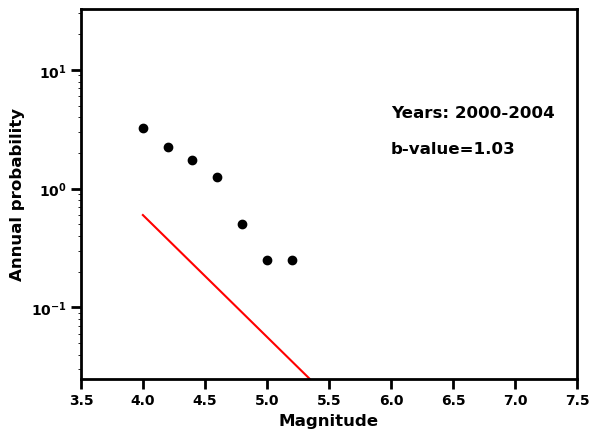

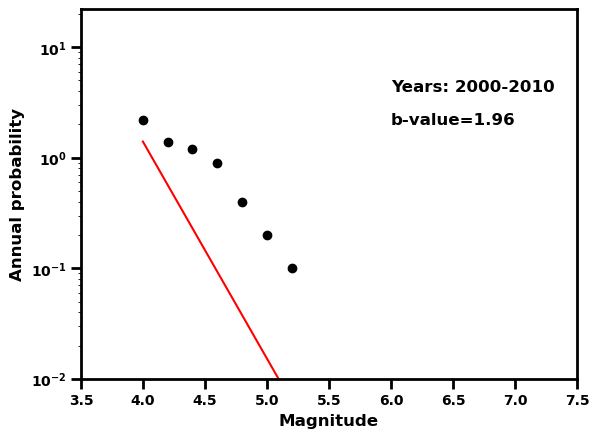

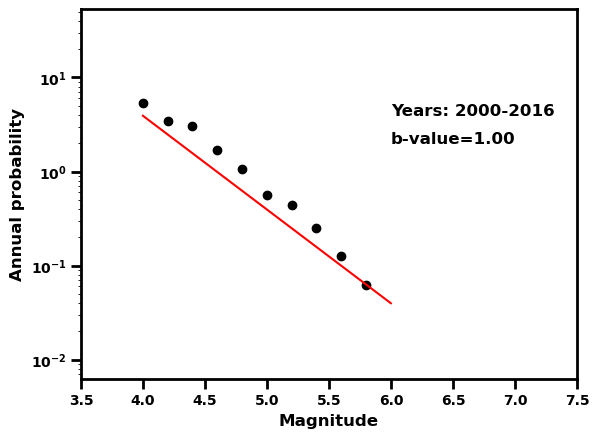

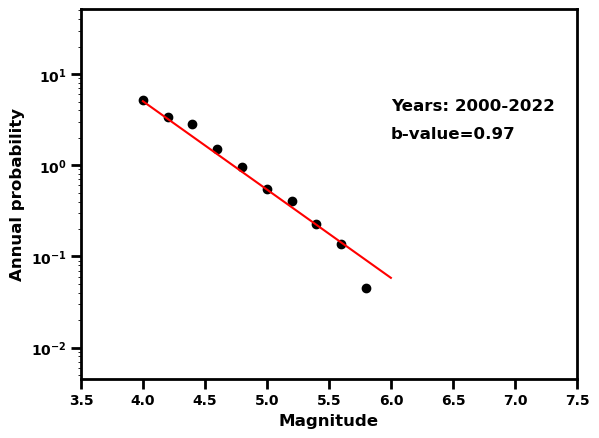

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Load earthquake data from CSV
data = pd.read_csv('/Users/Dell/Desktop/Tibet_2025udaya.csv')

# Convert 'datetime' to pandas datetime and ensure it's in UTC
data['datetime'] = pd.to_datetime(data['datetime'], utc=True)

# Find the 7.1 magnitude earthquake
eq_7_1 = data[data['mag'] == 7.1].iloc[0]

# Extract the epicenter coordinates and datetime of the 7.1 event
epicenter_lat = eq_7_1['latitude']
epicenter_lon = eq_7_1['longitude']
eq_time = eq_7_1['datetime']

# Filter events within a 1-degree radius of the epicenter
def filter_events_around_epicenter(df, lat, lon, radius=1.5):
    df['lat_diff'] = np.abs(df['latitude'] - lat)
    df['lon_diff'] = np.abs(df['longitude'] - lon)
    return df[(df['lat_diff'] <= radius) & (df['lon_diff'] <= radius)]

# Filter the events based on the epicenter and radius
filtered_data = filter_events_around_epicenter(data, epicenter_lat, epicenter_lon)

# Eliminate events after the 7.1 earthquake and its aftershocks
filtered_data_before_eq = filtered_data[filtered_data['datetime'] < eq_time]

# Function for recurrence analysis
def calc_recurrence(data, min_mag=4.0, max_mag=None, interval=0.1):
    magnitudes = data['mag']
    years = data['datetime'].dt.year

    if min_mag is None:
        min_mag = -1.0

    if max_mag is None:
        max_mag = max(magnitudes) + 0.1

    num_eq = len(magnitudes)
    num_years = max(years) - min(years)
    annual_num_eq = num_eq / num_years

    bins = np.arange(min_mag, max_mag, interval)
    plot_bins = np.arange(min_mag, max_mag, interval)

    hist = np.histogram(magnitudes, bins=bins)
    hist = hist[0][::-1]
    bins = bins[::-1]
    cum_hist = hist.cumsum()
    bins = bins[1:]

    cum_annual_rate = cum_hist / num_years
    new_cum_annual_rate = cum_annual_rate + 1e-20
    log_cum_sum = np.log10(new_cum_annual_rate)

    dm = 0.1
    b_mle = np.log10(np.exp(1)) / (np.mean(magnitudes) - (min_mag - dm / 2))
    b_dev = 2.3 * b_mle ** 2 * (np.var(magnitudes) / num_eq) ** 0.5

    return b_mle, bins, new_cum_annual_rate, plot_bins

# Loop through years and perform recurrence analysis incrementally
years = sorted(filtered_data_before_eq['datetime'].dt.year.unique())
step = 5  # Number of years to add in each step
for i in range(1, len(years) // step + 1):
    # Select data up to the current step
    year_limit = years[i * step - 1]
    data_subset = filtered_data_before_eq[filtered_data_before_eq['datetime'].dt.year <= year_limit]

    # Perform recurrence analysis on the subset
    b_mle, bins, new_cum_annual_rate, plot_bins = calc_recurrence(data_subset, min_mag=4.0, max_mag=None, interval=0.2)
    
    # Plot the recurrence relationship for this subset
    fig, ax = plt.subplots()
    ax.scatter(bins, new_cum_annual_rate, c='k')
    ax.plot(plot_bins, np.power(10, -1.0 * b_mle * plot_bins + 1.0 * b_mle * 4.0 + np.log10(len(data_subset) / (max(years) - min(years)))), c='r')

    ax.set_yscale('log')
    ax.set_ylim([min(new_cum_annual_rate) * 0.1, max(new_cum_annual_rate) * 10.])
    ax.set_xlim([4.0 - 0.5, 7.0 + 0.5])
    ax.set_ylabel('Annual probability', fontsize=12, fontweight='bold')
    ax.set_xlabel('Magnitude', fontsize=12, fontweight='bold')
    ax.text(6.00, 2.00, "b-value={:.2f}".format(b_mle), fontsize=12, fontweight='bold')
    ax.text(6.00, 4.00, "Years: {}-{}".format(min(years), year_limit), fontsize=12, fontweight='bold')

    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.tick_params(axis='both', which='major', width=2, length=7)
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontweight('bold')

    plt.show()


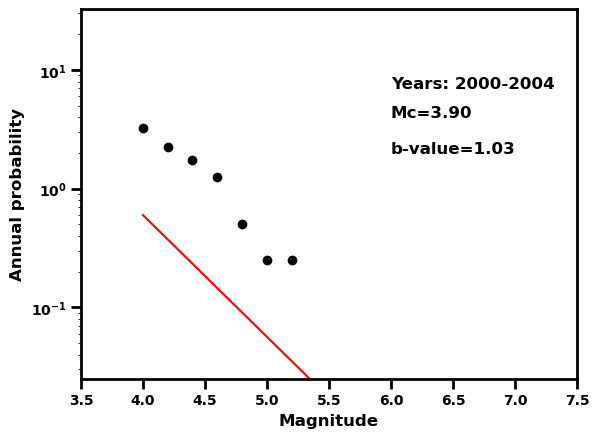

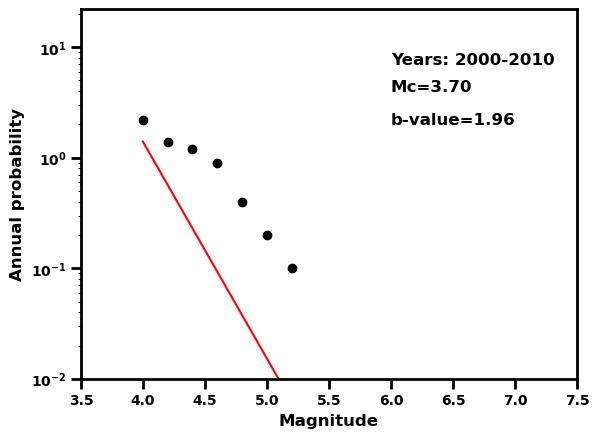

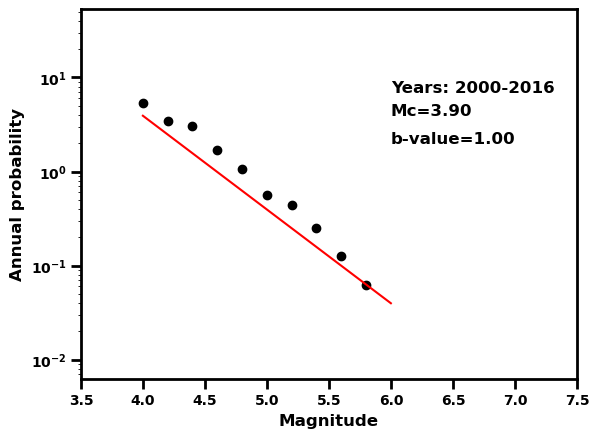

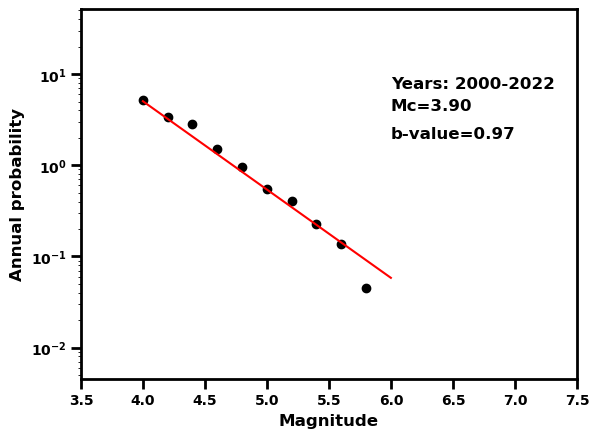

In [30]:
def calculate_magnitude_completeness(data, magnitude_column='mag', completeness_threshold=90):
    """
    Calculate the magnitude of completeness (Mc) based on the given data.
    Returns the magnitude at which the cumulative percentage reaches the threshold.
    """
    sorted_data = data.sort_values(magnitude_column, ascending=False)
    magnitudes = sorted_data[magnitude_column].unique()
    
    # Calculate cumulative counts for each magnitude
    cumulative_counts = [len(sorted_data[sorted_data[magnitude_column] >= mag]) for mag in magnitudes]
    
    # Calculate cumulative percentages
    total_count = len(data)
    percentages = [(count / total_count) * 100 for count in cumulative_counts]
    
    # Find the magnitude where cumulative percentage reaches the threshold
    Mc = None
    for i, percentage in enumerate(percentages):
        if percentage >= completeness_threshold:
            Mc = magnitudes[i]
            break
    
    return Mc

# Loop through years and perform recurrence analysis incrementally, also calculate Mc at each step
years = sorted(filtered_data_before_eq['datetime'].dt.year.unique())
step = 5  # Number of years to add in each step
for i in range(1, len(years) // step + 1):
    # Select data up to the current step
    year_limit = years[i * step - 1]
    data_subset = filtered_data_before_eq[filtered_data_before_eq['datetime'].dt.year <= year_limit]

    # Calculate magnitude completeness (Mc) for the subset
    Mc = calculate_magnitude_completeness(data_subset)

    # Perform recurrence analysis on the subset
    b_mle, bins, new_cum_annual_rate, plot_bins = calc_recurrence(data_subset, min_mag=4.0, max_mag=None, interval=0.2)
    
    # Plot the recurrence relationship for this subset
    fig, ax = plt.subplots()
    ax.scatter(bins, new_cum_annual_rate, c='k')
    ax.plot(plot_bins, np.power(10, -1.0 * b_mle * plot_bins + 1.0 * b_mle * 4.0 + np.log10(len(data_subset) / (max(years) - min(years)))), c='r')

    ax.set_yscale('log')
    ax.set_ylim([min(new_cum_annual_rate) * 0.1, max(new_cum_annual_rate) * 10.])
    ax.set_xlim([4.0 - 0.5, 7.0 + 0.5])
    ax.set_ylabel('Annual probability', fontsize=12, fontweight='bold')
    ax.set_xlabel('Magnitude', fontsize=12, fontweight='bold')
    ax.text(6.00, 2.00, "b-value={:.2f}".format(b_mle), fontsize=12, fontweight='bold')
    ax.text(6.00, 4.00, "Mc={:.2f}".format(Mc), fontsize=12, fontweight='bold')  # Display Mc
    ax.text(6.00, 7.00, "Years: {}-{}".format(min(years), year_limit), fontsize=12, fontweight='bold')

    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.tick_params(axis='both', which='major', width=2, length=7)
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontweight('bold')

    plt.show()


ValueError: x and y must be the same size

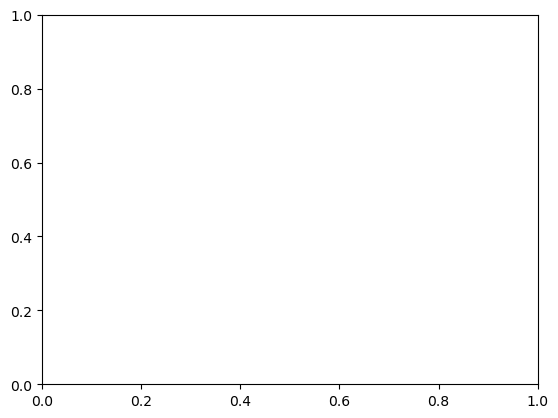

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate Mc (magnitude of completeness)
def calculate_magnitude_completeness(data, magnitude_column='mag', completeness_threshold=90):
    """
    Calculate the magnitude of completeness (Mc) based on the given data.
    Returns the magnitude at which the cumulative percentage reaches the threshold.
    """
    sorted_data = data.sort_values(magnitude_column, ascending=False)
    magnitudes = sorted_data[magnitude_column].unique()
    
    # Calculate cumulative counts for each magnitude
    cumulative_counts = [len(sorted_data[sorted_data[magnitude_column] >= mag]) for mag in magnitudes]
    
    # Calculate cumulative percentages
    total_count = len(data)
    percentages = [(count / total_count) * 100 for count in cumulative_counts]
    
    # Find the magnitude where cumulative percentage reaches the threshold
    Mc = None
    for i, percentage in enumerate(percentages):
        if percentage >= completeness_threshold:
            Mc = magnitudes[i]
            break
    
    return Mc

# Function to calculate recurrence (b-value)
def calc_recurrence(data, min_mag=4.0, max_mag=None, interval=0.2):
    magnitudes = data['mag']
    if max_mag is None:
        max_mag = max(magnitudes) + 0.1

    # Create bins based on interval
    bins = np.arange(min_mag, max_mag, interval)
    
    # Calculate cumulative annual rate of events
    counts, _ = np.histogram(magnitudes, bins=bins)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    # Calculate cumulative annual rate (frequency of occurrence)
    cumulative_counts = np.cumsum(counts)
    total_years = len(data['datetime'].dt.year.unique())
    cum_annual_rate = cumulative_counts / total_years
    
    # Fit the recurrence plot to get the b-value using maximum likelihood estimation (MLE)
    log_counts = np.log10(cum_annual_rate + 1e-6)  # Avoid log(0)
    log_bins = bin_centers
    
    # Linear fit to log-log plot to estimate b-value
    fit = np.polyfit(log_bins, log_counts, 1)
    b_mle = -fit[0]  # Slope of the line is the b-value
    
    # Prepare plot bins for recurrence plot
    plot_bins = np.linspace(min_mag, max_mag, 100)
    plot_counts = np.power(10, -1.0 * b_mle * plot_bins + np.log10(len(data) / (max(data['datetime'].dt.year) - min(data['datetime'].dt.year))))
    
    return b_mle, bins, cum_annual_rate, plot_bins

# Loop through years and perform recurrence analysis incrementally
years = sorted(filtered_data_before_eq['datetime'].dt.year.unique())
start_years = 12  # Start with the first 12 years of data
step = 2  # Add 2 years in each step

# Lists to store the evolution of a and b values
a_values = []
b_values = []
years_progression = []

# Start with first 12 years
for i in range(1, len(years) // step + 1):
    # Select data up to the current step
    year_limit = years[i * step - 1]
    data_subset = filtered_data_before_eq[filtered_data_before_eq['datetime'].dt.year <= year_limit]

    # Calculate magnitude completeness (Mc) for the subset
    Mc = calculate_magnitude_completeness(data_subset)

    # Perform recurrence analysis on the subset
    b_mle, bins, new_cum_annual_rate, plot_bins = calc_recurrence(data_subset, min_mag=4.0, max_mag=None, interval=0.2)
    
    # Calculate a-value using the relation for recurrence plot
    a_value = np.log10(len(data_subset) / (max(years) - min(years))) + b_mle * min(years)

    # Store the results for plotting
    a_values.append(a_value)
    b_values.append(b_mle)
    years_progression.append(year_limit)

    # Plot the recurrence relationship for this subset
    fig, ax = plt.subplots()
    ax.scatter(bins, new_cum_annual_rate, c='k')
    ax.plot(plot_bins, np.power(10, -1.0 * b_mle * plot_bins + np.log10(len(data_subset) / (max(years) - min(years)))), c='r')

    ax.set_yscale('log')
    ax.set_ylim([min(new_cum_annual_rate) * 0.1, max(new_cum_annual_rate) * 10.])
    ax.set_xlim([4.0 - 0.5, 7.0 + 0.5])
    ax.set_ylabel('Annual probability', fontsize=12, fontweight='bold')
    ax.set_xlabel('Magnitude', fontsize=12, fontweight='bold')
    ax.text(6.00, 2.00, "b-value={:.2f}".format(b_mle), fontsize=12, fontweight='bold')
    ax.text(6.00, 4.00, "Mc={:.2f}".format(Mc), fontsize=12, fontweight='bold')  # Display Mc
    ax.text(6.00, 7.00, "Years: {}-{}".format(min(years), year_limit), fontsize=12, fontweight='bold')

    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.tick_params(axis='both', which='major', width=2, length=7)
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontweight('bold')

    plt.show()

# Plot a-value and b-value over time in a single plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot b-values
ax1.plot(years_progression, b_values, color='tab:red', label='b-value', marker='o')
ax1.set_xlabel('Year', fontsize=12, fontweight='bold')
ax1.set_ylabel('b-value', color='tab:red', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelcolor='tab:red')

# Create a second y-axis to plot a-values
ax2 = ax1.twinx()
ax2.plot(years_progression, a_values, color='tab:blue', label='a-value', marker='o')
ax2.set_ylabel('a-value', color='tab:blue', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Set titles and grid
ax1.set_title('Evolution of a and b values over time', fontsize=14, fontweight='bold')
ax1.grid(True)

# Show plot
plt.tight_layout()
plt.show()


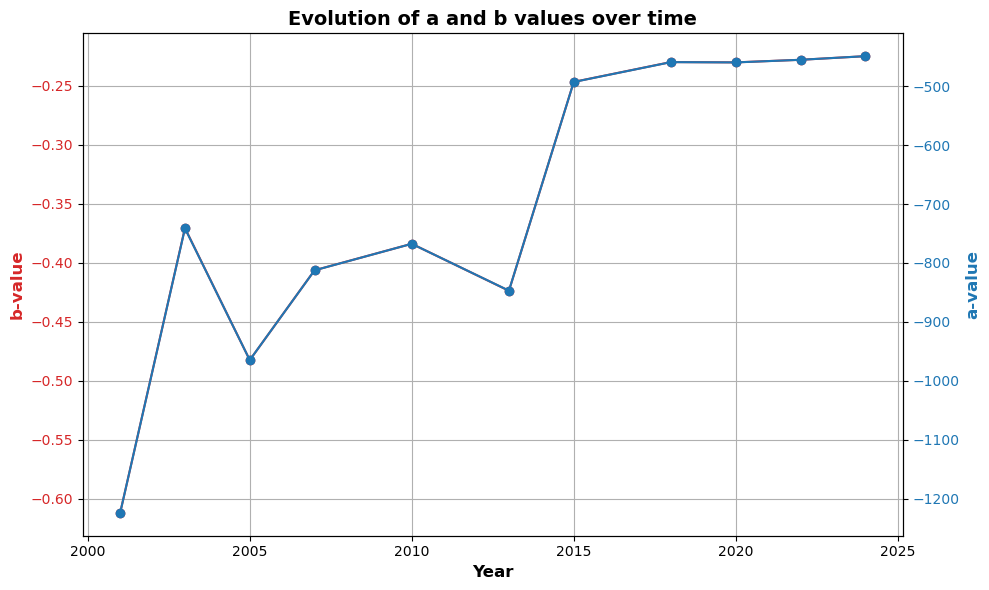

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Function to calculate Mc (magnitude of completeness)
def calculate_magnitude_completeness(data, magnitude_column='mag', completeness_threshold=90):
    sorted_data = data.sort_values(magnitude_column, ascending=False)
    magnitudes = sorted_data[magnitude_column].unique()
    
    # Calculate cumulative counts for each magnitude
    cumulative_counts = [len(sorted_data[sorted_data[magnitude_column] >= mag]) for mag in magnitudes]
    
    # Calculate cumulative percentages
    total_count = len(data)
    percentages = [(count / total_count) * 100 for count in cumulative_counts]
    
    # Find the magnitude where cumulative percentage reaches the threshold
    Mc = None
    for i, percentage in enumerate(percentages):
        if percentage >= completeness_threshold:
            Mc = magnitudes[i]
            break
    
    return Mc

# Function to calculate recurrence (b-value)
def calc_recurrence(data, min_mag=4.0, max_mag=None, interval=0.2):
    magnitudes = data['mag']
    if max_mag is None:
        max_mag = max(magnitudes) + 0.1

    # Create bins based on interval
    bins = np.arange(min_mag, max_mag, interval)
    
    # Calculate cumulative annual rate of events
    counts, _ = np.histogram(magnitudes, bins=bins)
    bin_centers = (bins[:-1] + bins[1:]) / 2

    # Calculate cumulative annual rate (frequency of occurrence)
    cumulative_counts = np.cumsum(counts)
    total_years = len(data['datetime'].dt.year.unique())
    cum_annual_rate = cumulative_counts / total_years
    
    # Fit the recurrence plot to get the b-value using maximum likelihood estimation (MLE)
    log_counts = np.log10(cum_annual_rate + 1e-6)  # Avoid log(0)
    log_bins = bin_centers
    
    # Linear fit to log-log plot to estimate b-value
    fit = np.polyfit(log_bins, log_counts, 1)
    b_mle = -fit[0]  # Slope of the line is the b-value
    
    # Prepare plot bins for recurrence plot
    plot_bins = np.linspace(min_mag, max_mag, 100)
    plot_counts = np.power(10, -1.0 * b_mle * plot_bins + np.log10(len(data) / (max(data['datetime'].dt.year) - min(data['datetime'].dt.year))))
    
    return b_mle, bins, cum_annual_rate, plot_bins

# Loop through years and perform recurrence analysis incrementally
years = sorted(filtered_data_before_eq['datetime'].dt.year.unique())
start_years = 12  # Start with the first 12 years of data
step = 2  # Add 2 years in each step

# Lists to store the evolution of a and b values
a_values = []
b_values = []
years_progression = []

# Start with first 12 years
for i in range(1, len(years) // step + 1):
    # Select data up to the current step
    year_limit = years[i * step - 1]
    data_subset = filtered_data_before_eq[filtered_data_before_eq['datetime'].dt.year <= year_limit]

    # Calculate magnitude completeness (Mc) for the subset
    Mc = calculate_magnitude_completeness(data_subset)

    # Perform recurrence analysis on the subset
    b_mle, bins, new_cum_annual_rate, plot_bins = calc_recurrence(data_subset, min_mag=4.0, max_mag=None, interval=0.2)
    
    # Calculate a-value using the relation for recurrence plot
    a_value = np.log10(len(data_subset) / (max(years) - min(years))) + b_mle * min(years)

    # Store the results for plotting
    a_values.append(a_value)
    b_values.append(b_mle)
    years_progression.append(year_limit)

# Plot a-value and b-value over time in a single plot with separate y-axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot b-values on the first y-axis
ax1.plot(years_progression, b_values, color='tab:red', label='b-value', marker='o')
ax1.set_xlabel('Year', fontsize=12, fontweight='bold')
ax1.set_ylabel('b-value', color='tab:red', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelcolor='tab:red')

# Create a second y-axis to plot a-values
ax2 = ax1.twinx()
ax2.plot(years_progression, a_values, color='tab:blue', label='a-value', marker='o')
ax2.set_ylabel('a-value', color='tab:blue', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Set titles and grid
ax1.set_title('Evolution of a and b values over time', fontsize=14, fontweight='bold')
ax1.grid(True)

# Show plot
plt.tight_layout()
plt.show()


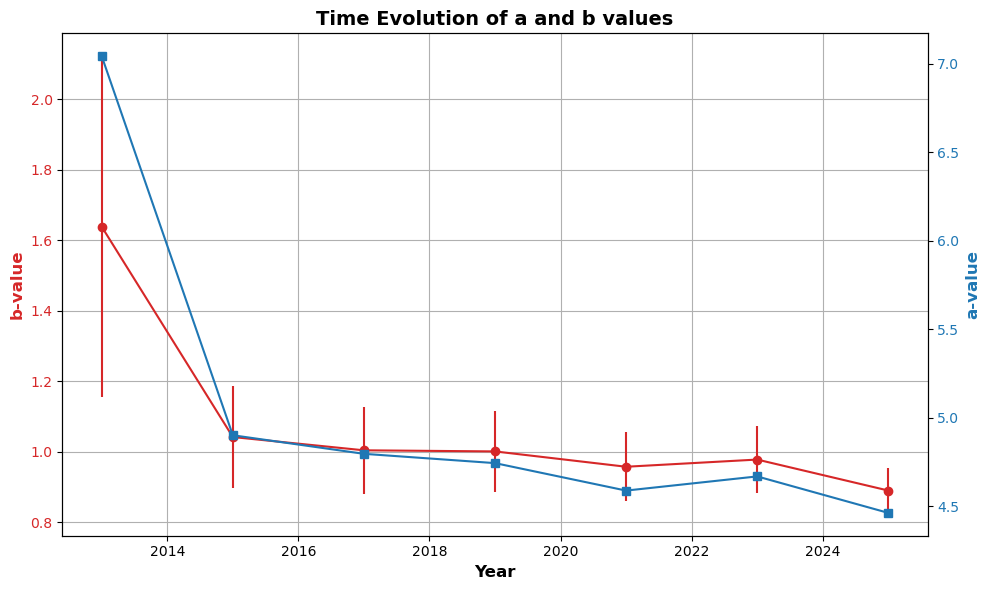

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from geopy.distance import geodesic

# Function to filter events within a radius of 1.5 degrees
def filter_events_around_eq(data, eq_lat, eq_lon, radius_deg=1.5):
    """Filter earthquakes within a given radius (degrees) of a reference event."""
    filtered_data = data[
        np.sqrt((data["latitude"] - eq_lat) ** 2 + (data["longitude"] - eq_lon) ** 2) <= radius_deg
    ]
    return filtered_data

# Function to calculate magnitude completeness (Mc)
def calculate_magnitude_completeness(data, completeness_threshold=90):
    sorted_data = data.sort_values("mag", ascending=False)
    magnitudes = sorted_data["mag"].unique()
    
    # Compute cumulative count
    cumulative_counts = [len(sorted_data[sorted_data["mag"] >= mag]) for mag in magnitudes]
    
    # Compute percentage
    total_count = len(data)
    percentages = [(count / total_count) * 100 for count in cumulative_counts]
    
    # Find Mc where percentage reaches threshold
    Mc = next((magnitudes[i] for i, p in enumerate(percentages) if p >= completeness_threshold), None)
    
    return Mc

# Function to compute recurrence analysis and b, a values
def calc_recurrence(data, min_mag=None, max_mag=None, interval=0.2):
    magnitudes = data["mag"].values
    years = data["datetime"].dt.year.values

    if min_mag is None:
        min_mag = min(magnitudes)

    if max_mag is None:
        max_mag = max(magnitudes) + 0.1

    num_eq = len(magnitudes)
    num_years = max(years) - min(years)
    annual_num_eq = num_eq / num_years
    
    bins = np.arange(min_mag, max_mag + interval, interval)
    plot_bins = np.arange(min_mag, max_mag, interval)

    hist = np.histogram(magnitudes, bins=bins)[0][::-1]
    bins = bins[::-1]
    cum_hist = hist.cumsum()
    bins = bins[1:]

    cum_annual_rate = cum_hist / num_years
    new_cum_annual_rate = cum_annual_rate + 1e-20
    log_cum_sum = np.log10(new_cum_annual_rate)

    # Calculate b-value using Maximum Likelihood Estimation (MLE)
    dm = 0.1
    b_mle = np.log10(np.exp(1)) / (np.mean(magnitudes) - (min_mag - dm / 2))
    b_dev = 2.3 * b_mle ** 2 * (np.var(magnitudes) / num_eq) ** 0.5

    # Calculate a-value
    a_value = np.log10(annual_num_eq) + b_mle * min_mag

    return b_mle, b_dev, a_value

# Extract the location and time of the 7.1 earthquake
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_time, eq_lat, eq_lon = eq_event["datetime"], eq_event["latitude"], eq_event["longitude"]

# Filter data within 1.5° radius
filtered_data = filter_events_around_eq(data, eq_lat, eq_lon, radius_deg=1.5)

# Define year increments
years = list(range(2013, 2026, 2))  # 2000 to 2013, 2000 to 2015, ..., 2000 to 2025

# Storage lists for plotting
b_values = []
b_errors = []
a_values = []
year_steps = []

# Loop through different time windows
for end_year in years:
    data_subset = filtered_data[filtered_data["datetime"].dt.year <= end_year]
    
    # Compute Mc, b, a values
    Mc = calculate_magnitude_completeness(data_subset)
    b_mle, b_dev, a_value = calc_recurrence(data_subset, min_mag=4.0, max_mag=None, interval=0.2)

    # Store results
    b_values.append(b_mle)
    b_errors.append(b_dev)
    a_values.append(a_value)
    year_steps.append(end_year)

# Plot the evolution of a and b values over time
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot b-values with error bars (red)
ax1.errorbar(year_steps, b_values, yerr=b_errors, fmt='o-', color='tab:red', label="b-value")
ax1.set_xlabel('Year', fontsize=12, fontweight='bold')
ax1.set_ylabel('b-value', color='tab:red', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', labelcolor='tab:red')

# Create second y-axis for a-values (blue)
ax2 = ax1.twinx()
ax2.plot(year_steps, a_values, 's-', color='tab:blue', label="a-value")
ax2.set_ylabel('a-value', color='tab:blue', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Title and grid
ax1.set_title('Time Evolution of a and b values', fontsize=14, fontweight='bold')
ax1.grid(True)

# Show plot
plt.tight_layout()
plt.show()


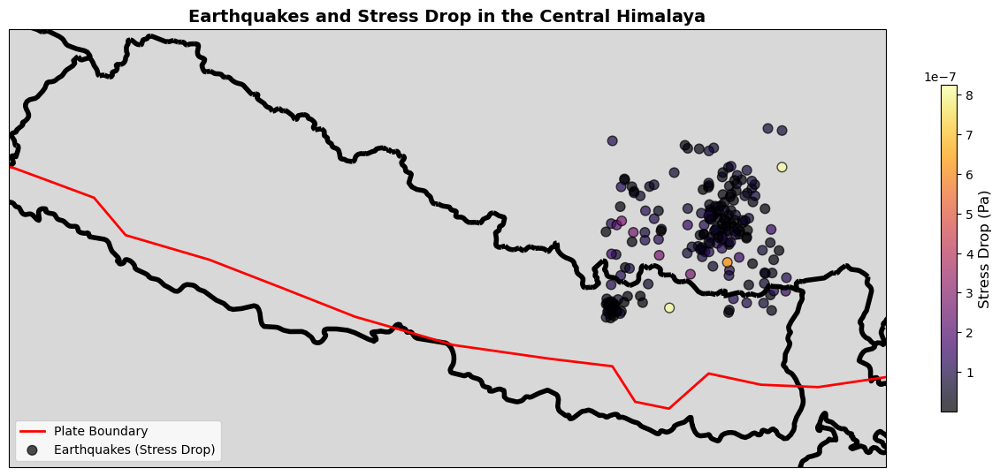

In [62]:
# Function to calculate stress drop based on magnitude and distance
def stress_drop(magnitude, radius):
    """
    Calculate stress drop approximation based on magnitude and fault radius.
    Magnitude is in Mw (Moment Magnitude), radius is in kilometers.
    """
    # Assuming a simplified formula
    radius_meters = radius * 1000  # Convert to meters
    return (7 / 16) * (magnitude ** 3) / (radius_meters ** 2)

# Calculate the stress drop for each earthquake
radius_of_fault = 10**(0.8 * data["mag"] - 2)  # Approximate radius (in km)
data["stress_drop"] = stress_drop(data["mag"], radius_of_fault)

# Visualize stress drop on the map (using color scale)
fig, ax = plt.subplots(figsize=(16, 12), subplot_kw={"projection": ccrs.PlateCarree()})
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Plot tectonic plate boundaries (same as before)
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes, colored by stress drop
sc = ax.scatter(data["longitude"], data["latitude"], c=data["stress_drop"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes (Stress Drop)")

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.4)
cbar.set_label("Stress Drop (Pa)", fontsize=12)

# Other features
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=4)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Title and legend
plt.title("Earthquakes and Stress Drop in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


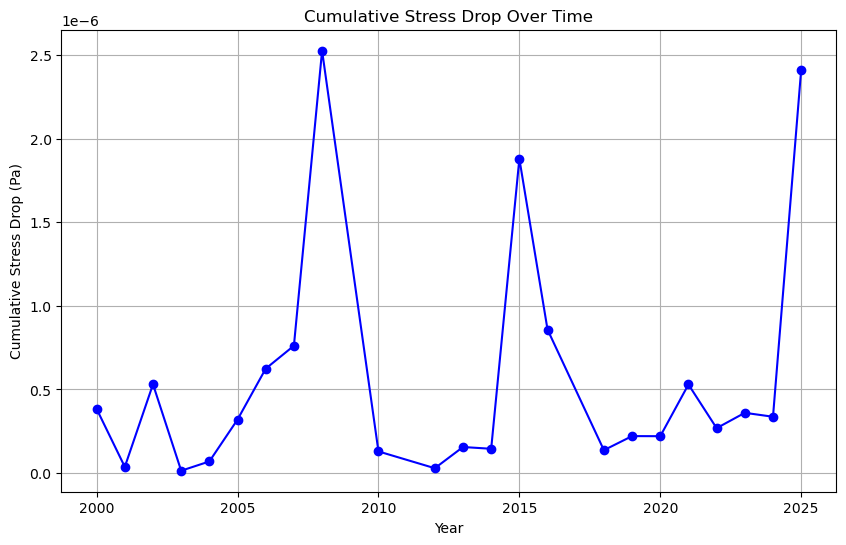

In [63]:
# Group the data by year and sum the stress drops
data['year'] = data['datetime'].dt.year
stress_by_year = data.groupby('year')['stress_drop'].sum()

# Plot stress accumulation over time
plt.figure(figsize=(10, 6))
plt.plot(stress_by_year.index, stress_by_year.values, marker='o', linestyle='-', color='b')
plt.xlabel("Year")
plt.ylabel("Cumulative Stress Drop (Pa)")
plt.title("Cumulative Stress Drop Over Time")
plt.grid(True)
plt.show()


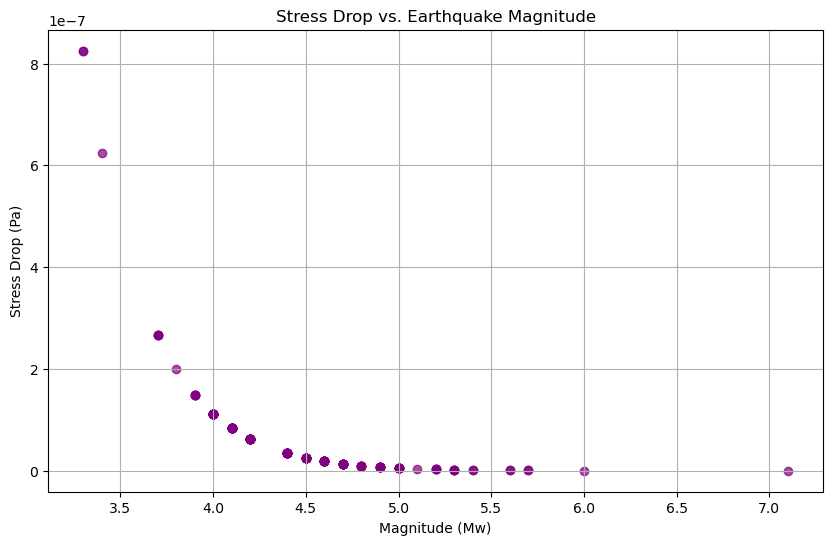

In [64]:
# Plot stress drop vs earthquake magnitude
plt.figure(figsize=(10, 6))
plt.scatter(data["mag"], data["stress_drop"], alpha=0.7, color="purple")
plt.xlabel("Magnitude (Mw)")
plt.ylabel("Stress Drop (Pa)")
plt.title("Stress Drop vs. Earthquake Magnitude")
plt.grid(True)
plt.show()


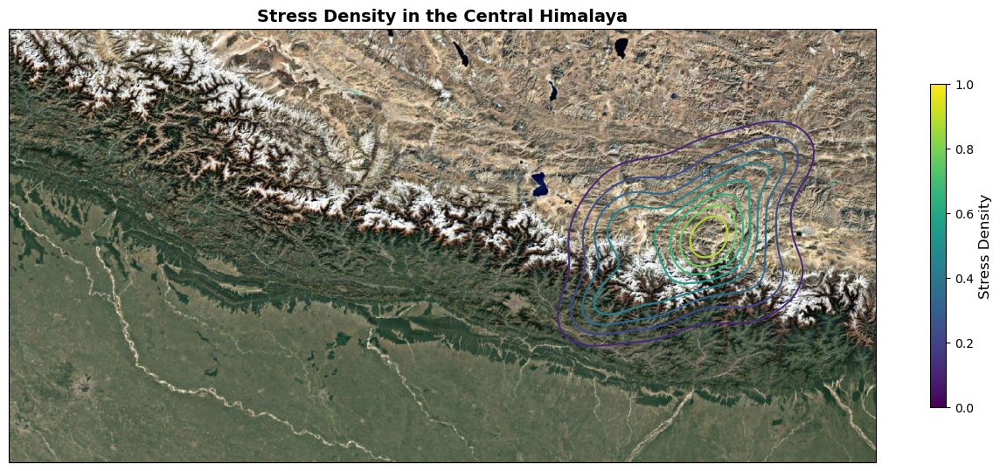

In [65]:
# Kernel density estimate for stress drops (spatial distribution)
from scipy.stats import gaussian_kde

# Create KDE based on stress drop location
stress_positions = np.vstack([data["longitude"], data["latitude"]])
kde = gaussian_kde(stress_positions, weights=data["stress_drop"])

# Create grid for KDE
longitude_grid, latitude_grid = np.meshgrid(np.linspace(min_lon, max_lon, 500),
                                            np.linspace(min_lat, max_lat, 500))

grid_positions = np.vstack([longitude_grid.ravel(), latitude_grid.ravel()])
density = kde(grid_positions).reshape(longitude_grid.shape)

# Visualize the stress density on the map
fig, ax = plt.subplots(figsize=(16, 12), subplot_kw={"projection": ccrs.PlateCarree()})
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Add satellite imagery as background
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Plot stress density
contour = ax.contour(longitude_grid, latitude_grid, density, cmap="viridis", levels=np.linspace(0, np.max(density), 10), transform=ccrs.PlateCarree())

# Add colorbar
cbar = plt.colorbar(contour.collections[0], ax=ax, shrink=0.4)
cbar.set_label("Stress Density", fontsize=12)

# Add other features like tectonic boundaries, earthquakes, etc.
plt.title("Stress Density in the Central Himalaya", fontsize=14, fontweight="bold")
plt.show()


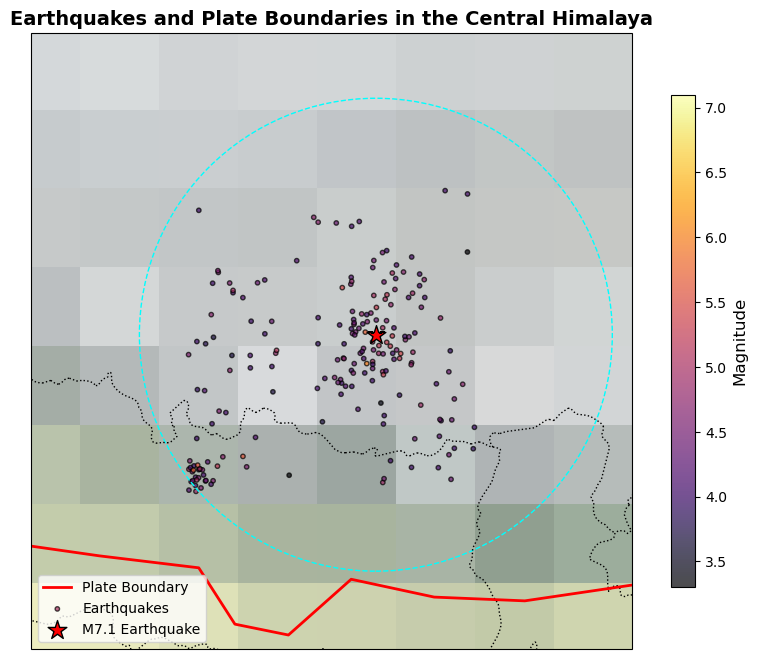

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1, data["latitude"].max() + 1
min_lon, max_lon = data["longitude"].min() - 1, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create a Cartopy map
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={"projection": ccrs.PlateCarree()})

# Add satellite imagery (Optional: Requires Basemap's ArcGIS image service)
ax.stock_img()  # Use built-in background map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=10, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=200, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features
ax.add_feature(cfeature.BORDERS, linestyle=":")
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Magnitude", fontsize=12)

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)
plt.show()


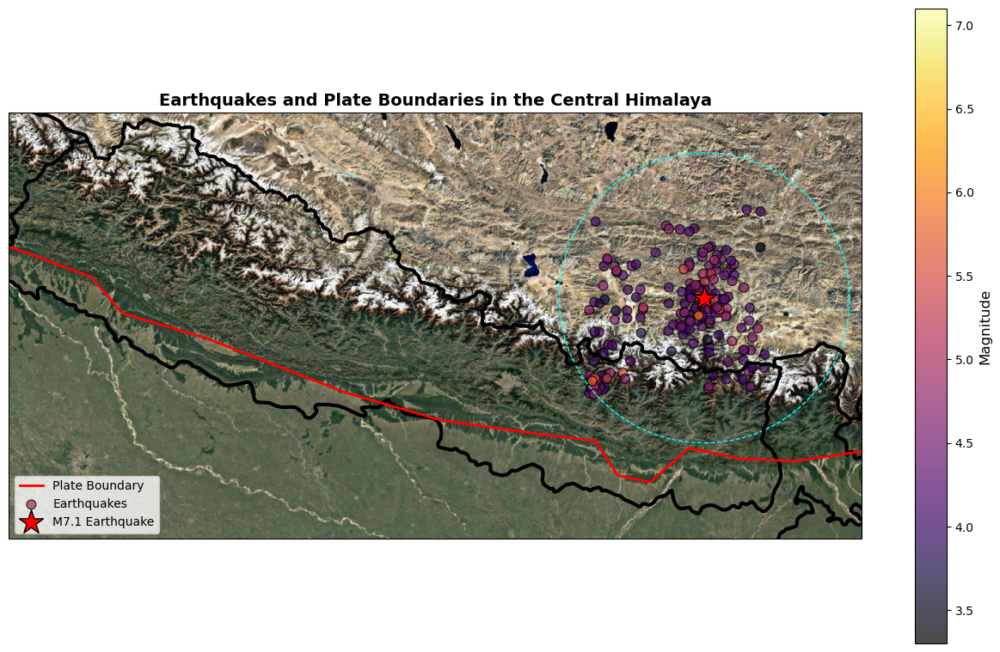

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1.5, data["latitude"].max() + 1.0
min_lon, max_lon = data["longitude"].min() - 6.0, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create the plot with Cartopy
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

# Set the extent for the map
ax.set_extent(region, crs=ccrs.PlateCarree())
# Add ESRI Satellite Imagery as the background
from cartopy.io.img_tiles import GoogleTiles
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Add a background map
ax.stock_img()  # Use Cartopy's built-in background map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())  # Set the map extent based on the earthquake data

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=450, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=3)
#ax.add_feature(cfeature.COASTLINE, linewidth=5)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Magnitude", fontsize=12)

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


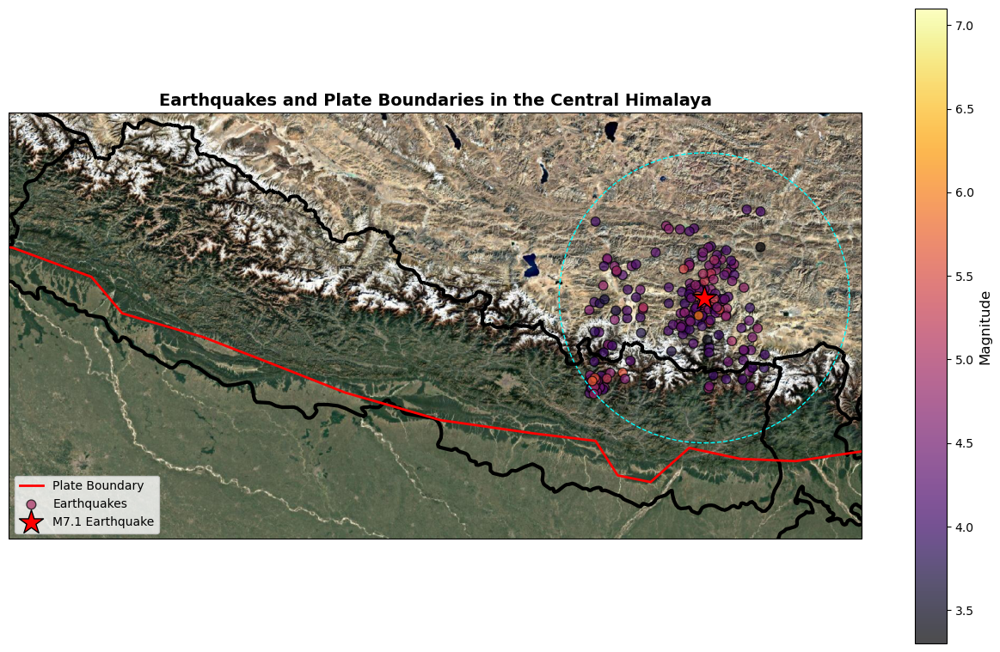

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point
from cartopy.io.img_tiles import GoogleTiles

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1.5, data["latitude"].max() + 1.0
min_lon, max_lon = data["longitude"].min() - 6.0, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create the plot with Cartopy
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

# Set the extent for the map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Add ESRI Satellite Imagery as the background
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=450, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=3)
ax.add_feature(cfeature.COASTLINE, linewidth=5)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Magnitude", fontsize=12)

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


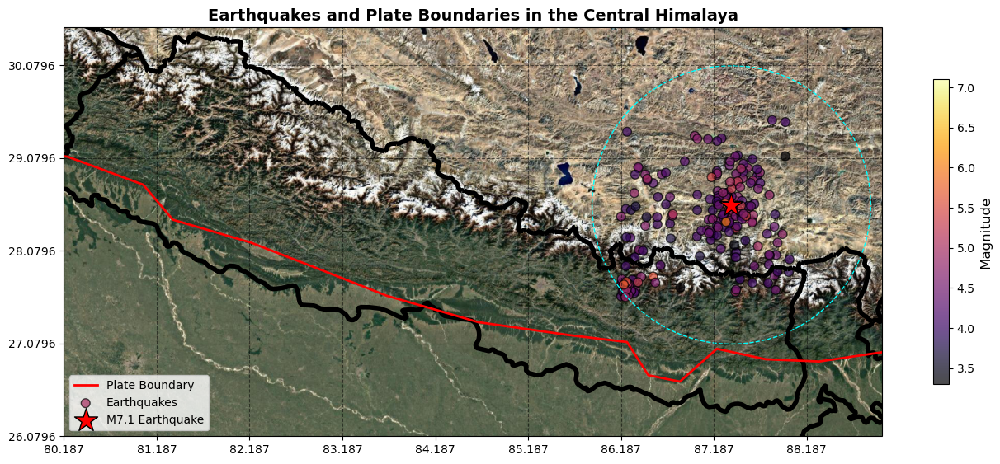

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point
from cartopy.io.img_tiles import GoogleTiles

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1.5, data["latitude"].max() + 1.0
min_lon, max_lon = data["longitude"].min() - 6.0, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create the plot with Cartopy
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

# Set the extent for the map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Add ESRI Satellite Imagery as the background
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=450, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=4)
ax.add_feature(cfeature.COASTLINE, linewidth=5)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.4)
cbar.set_label("Magnitude", fontsize=12)

# Add gridlines and ticks
ax.grid(True, linestyle='--', color='black', alpha=0.5)

# Set ticks manually
ax.set_xticks(np.arange(min_lon, max_lon, 1))  # Longitude ticks
ax.set_yticks(np.arange(min_lat, max_lat, 1))  # Latitude ticks
ax.set_xticklabels(np.arange(min_lon, max_lon, 1), fontsize=10)
ax.set_yticklabels(np.arange(min_lat, max_lat, 1), fontsize=10)

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


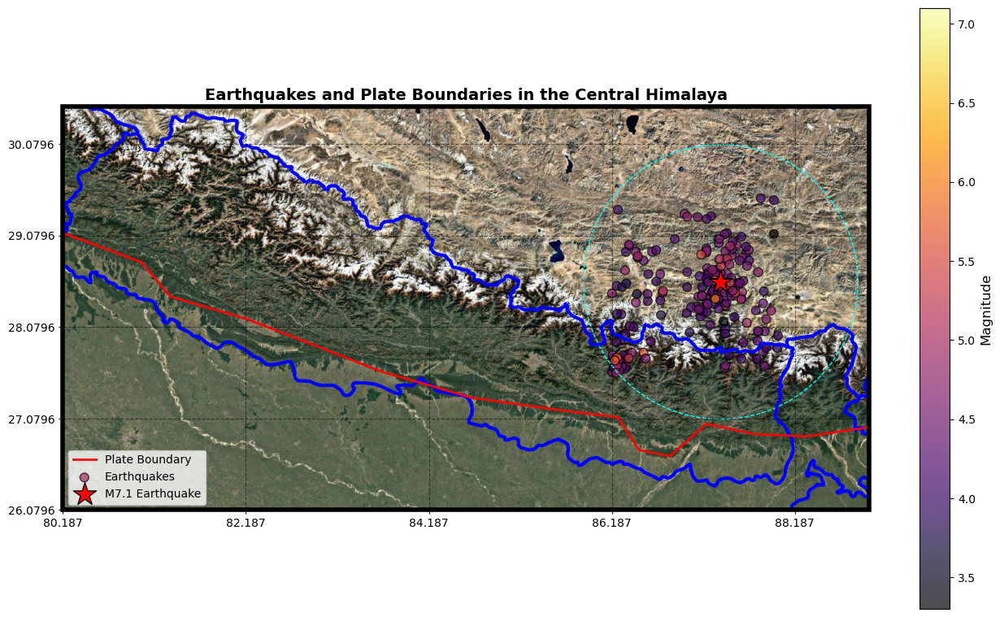

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point
from cartopy.io.img_tiles import GoogleTiles

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1.5, data["latitude"].max() + 1.0
min_lon, max_lon = data["longitude"].min() - 6.0, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create the plot with Cartopy
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

# Set the extent for the map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Add ESRI Satellite Imagery as the background
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=450, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features with enhanced borders
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=3, edgecolor="blue")  # Make borders more prominent
ax.add_feature(cfeature.COASTLINE, linewidth=5)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Magnitude", fontsize=12)

# Add gridlines for latitudes and longitudes (Ticks)
ax.grid(True, linestyle='--', color='black', alpha=0.5)

# Set ticks manually to include latitudes and longitudes
ax.set_xticks(np.arange(min_lon, max_lon, 2))  # Longitude ticks (every 2 degrees)
ax.set_yticks(np.arange(min_lat, max_lat, 1))  # Latitude ticks (every 1 degree)
ax.set_xticklabels(np.arange(min_lon, max_lon, 2), fontsize=10)
ax.set_yticklabels(np.arange(min_lat, max_lat, 1), fontsize=10)

# Set frame (border)
ax.spines['geo'].set_visible(True)  # Show frame (border) around the map
ax.spines['geo'].set_edgecolor('black')  # Border color
ax.spines['geo'].set_linewidth(4)  # Border width

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


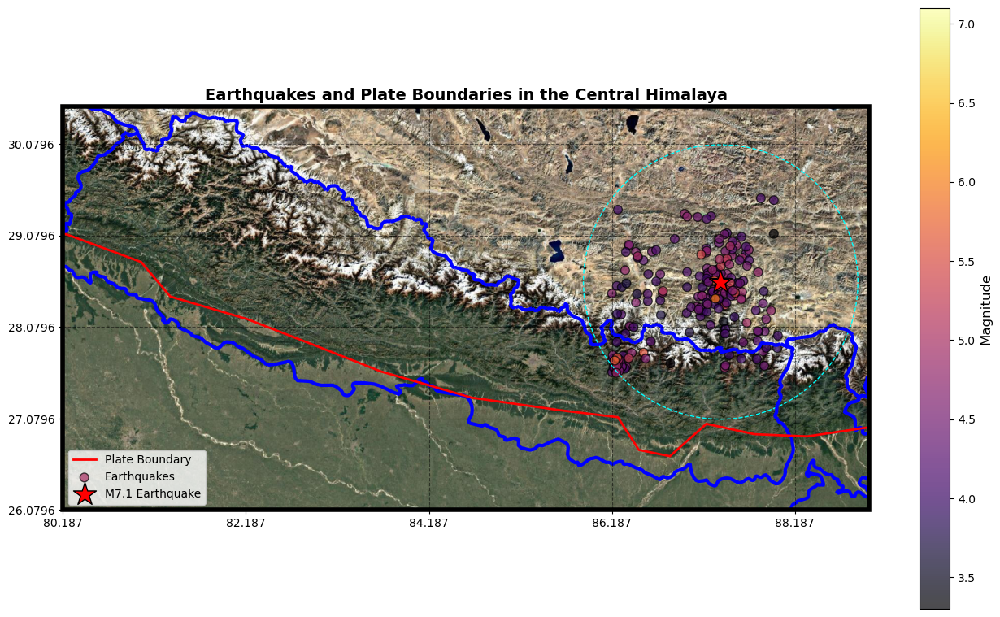

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point
from cartopy.io.img_tiles import GoogleTiles

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1.5, data["latitude"].max() + 1.0
min_lon, max_lon = data["longitude"].min() - 6.0, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create the plot with Cartopy
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

# Set the extent for the map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Add ESRI Satellite Imagery as the background
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=450, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features with enhanced borders
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=3, edgecolor="blue")  # Make borders more prominent
ax.add_feature(cfeature.COASTLINE, linewidth=5)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label("Magnitude", fontsize=12)

# Add gridlines for latitudes and longitudes (Ticks)
ax.grid(True, linestyle='--', color='black', alpha=0.5)

# Set ticks manually to include latitudes and longitudes
ax.set_xticks(np.arange(min_lon, max_lon, 2))  # Longitude ticks (every 2 degrees)
ax.set_yticks(np.arange(min_lat, max_lat, 1))  # Latitude ticks (every 1 degree)
ax.set_xticklabels(np.arange(min_lon, max_lon, 2), fontsize=10, color='black')  # Set tick color to black
ax.set_yticklabels(np.arange(min_lat, max_lat, 1), fontsize=10, color='black')  # Set tick color to black

# Set frame (border) to black
ax.spines['geo'].set_visible(True)  # Show frame (border) around the map
ax.spines['geo'].set_edgecolor('black')  # Set border color to black
ax.spines['geo'].set_linewidth(4)  # Set border width

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


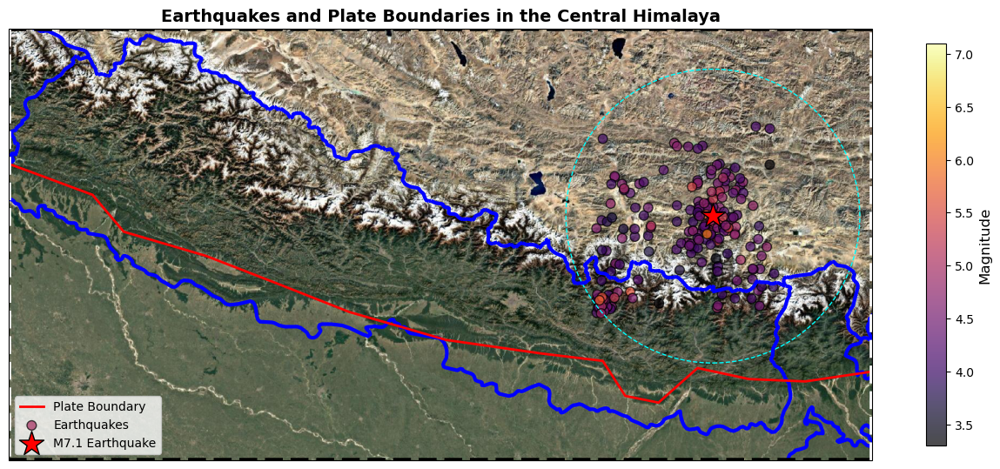

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from shapely.geometry import Point
from cartopy.io.img_tiles import GoogleTiles

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1.5, data["latitude"].max() + 1.0
min_lon, max_lon = data["longitude"].min() - 6.0, data["longitude"].max() + 1

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Create the plot with Cartopy
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())

# Set the extent for the map
ax.set_extent([min_lon, max_lon, min_lat, max_lat], crs=ccrs.PlateCarree())

# Add ESRI Satellite Imagery as the background
satellite = GoogleTiles(style='satellite')
ax.add_image(satellite, 8)

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        ax.plot(x, y, 'r-', linewidth=2, transform=ccrs.PlateCarree(), label="Plate Boundary" if _ == 0 else "")

# Scatter plot of earthquakes (color by magnitude)
sc = ax.scatter(data["longitude"], data["latitude"], c=data["mag"], cmap="inferno", edgecolors="black", alpha=0.7, s=60, transform=ccrs.PlateCarree(), label="Earthquakes")

# Mark the M7.1 earthquake
ax.scatter(eq_lon, eq_lat, color="red", edgecolors="black", marker="*", s=450, transform=ccrs.PlateCarree(), label="M7.1 Earthquake")

# Draw a 1.5° radius around the epicenter
circle = plt.Circle((eq_lon, eq_lat), radius=1.5, color="cyan", fill=False, linestyle="dashed", transform=ccrs.PlateCarree())
ax.add_patch(circle)

# Add map features
ax.add_feature(cfeature.BORDERS, linestyle="-", linewidth=3, edgecolor="blue")  # Blue border
ax.add_feature(cfeature.COASTLINE, linewidth=5)
ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="gray", alpha=0.3)

# Add colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label("Magnitude", fontsize=12)

# Draw alternating dashed black and white borders
# Coordinates of the map limits
border_coords = [
    [min_lon, min_lat], [max_lon, min_lat],
    [max_lon, max_lat], [min_lon, max_lat],
    [min_lon, min_lat]
]

# Plot black dashes
for i in range(0, len(border_coords)-1, 2):
    ax.plot(
        [border_coords[i][0], border_coords[i+1][0]],
        [border_coords[i][1], border_coords[i+1][1]],
        color='black', linestyle="--", linewidth=4, transform=ccrs.PlateCarree()
    )

# Plot white dashes
for i in range(1, len(border_coords)-1, 2):
    ax.plot(
        [border_coords[i][0], border_coords[i+1][0]],
        [border_coords[i][1], border_coords[i+1][1]],
        color='white', linestyle="--", linewidth=4, transform=ccrs.PlateCarree()
    )

# Labels and legend
plt.title("Earthquakes and Plate Boundaries in the Central Himalaya", fontsize=14, fontweight="bold")
plt.legend(loc="lower left", fontsize=10)

# Show the plot
plt.show()


plot [WARNING]: Cannot use auto-legend -l for variable symbol color. Option -l ignored.


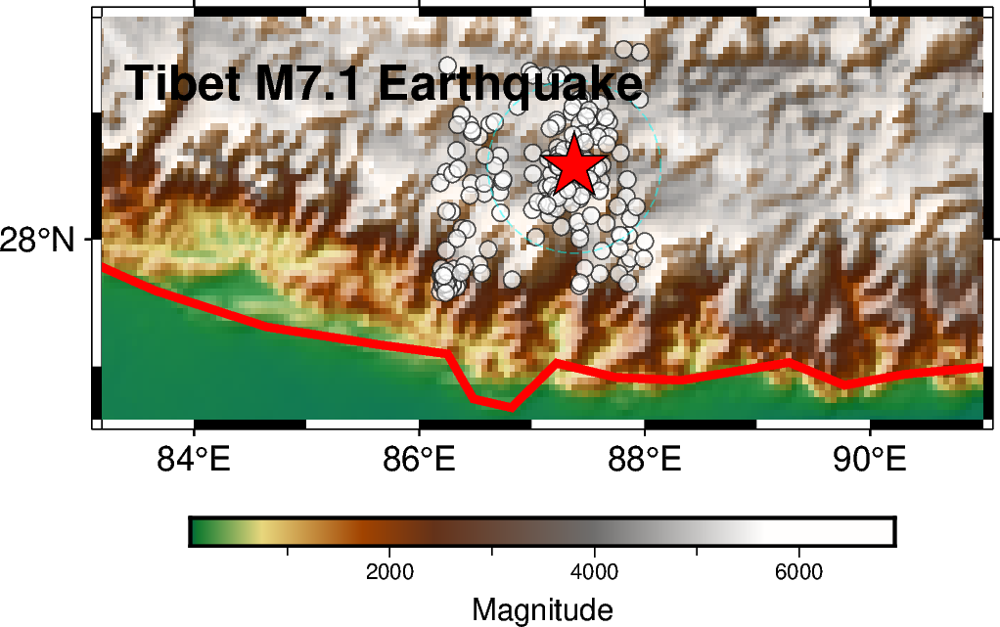

In [23]:
import numpy as np
import pandas as pd
import pygmt
import geopandas as gpd
from shapely.geometry import Point

# Load earthquake data
data["year"] = data["datetime"].dt.year

# Extract the M7.1 earthquake location
eq_event = data[data["mag"] == 7.1].iloc[0]
eq_lat, eq_lon = eq_event["latitude"], eq_event["longitude"]

# Define the study region boundaries
min_lat, max_lat = data["latitude"].min() - 1, data["latitude"].max() + 0.25
min_lon, max_lon = data["longitude"].min() - 3, data["longitude"].max() + 3

# Load tectonic plate boundaries (GEM dataset)
plates = gpd.read_file("https://github.com/fraxen/tectonicplates/raw/master/GeoJSON/PB2002_boundaries.json")

# Set up the figure
fig = pygmt.Figure()

# Plot Earth relief (topography) background
fig.basemap(region=[min_lon, max_lon, min_lat, max_lat], projection="M3i", frame=True)
fig.grdimage(grid="@earth_relief_03m", cmap="geo", shading=True)

# Plot tectonic plate boundaries
for _, row in plates.iterrows():
    if row.geometry.geom_type == "LineString":
        x, y = row.geometry.xy
        fig.plot(x=x, y=y, pen="2p,red", label="Plate Boundary")

# Scatter plot of earthquakes (color by magnitude)
fig.plot(
    x=data["longitude"],
    y=data["latitude"],
    style="c0.15c",
    fill=data["mag"],
    cmap="hot",
    pen="black",
    transparency=30,
    label="Earthquakes",
)

# Mark the M7.1 earthquake with a star
fig.plot(
    x=eq_lon,
    y=eq_lat,
    style="a0.6c",
    fill="red",
    pen="black",
    label="M7.1 Earthquake",
)

# Draw a 1.5° radius around the epicenter
fig.plot(x=eq_lon, y=eq_lat, style="c1.5c", pen="cyan,dashed", transparency=50)

# Add a color scale for magnitude
fig.colorbar(frame="x+lMagnitude")

# Title
fig.text(x=min_lon + 2.5, y=max_lat - 0.5, text= "Tibet M7.1 Earthquake", font="12p,Helvetica-Bold,black")

# Show the map
fig.show()
